# Zadanie domowe -- interpolacja dwusześcienna

Interpolacja dwusześcienna, to podobnie jak w przypadku interpolacji dwuliniowej, rozszerzenie idei interpolacji jednowymiarowej na dwuwymiarową siatkę.
W trakcie jej obliczania wykorzystywane jest 16 pikseli z otoczenia (dla dwuliniowej 4).
Skutkuje to zwykle lepszymi wynikami - obraz wyjściowy jest bardziej gładki i z mniejszą liczbą artefaktów.
Ceną jest znaczny wzrost złożoności obliczeniowej (zostało to zaobserwowane podczas ćwiczenia).

Interpolacja dana jest wzorem:
\begin{equation}
I(i,j) = \sum_{i=0}^{3} \sum_{j=0}^{3} a_{ij} x^i y^j
\end{equation}

Zadanie sprowadza się zatem do wyznaczenia 16 współczynników $a_{ij}$.
W tym celu wykorzystuje się, oprócz wartość w~puntach $A$ (0,0), $B$ (1 0), $C$ (1,1), $D$ (0,1) (por. rysunek dotyczący interpolacji dwuliniowej), także pochodne cząstkowe $A_x$, $A_y$, $A_{xy}$.
Pozwala to rozwiązać układ 16-tu równań.

Jeśli zgrupujemy parametry $a_{ij}$:
\begin{equation}
a = [ a_{00}~a_{10}~a_{20}~a_{30}~a_{01}~a_{11}~a_{21}~a_{31}~a_{02}~a_{12}~a_{22}~a_{32}~a_{03}~a_{13}~a_{23}~a_{33}]
\end{equation}

i przyjmiemy:
\begin{equation}
x = [A~B~D~C~A_x~B_x~D_x~C_x~A_y~B_y~D_y~C_y~A_{xy}~B_{xy}~D_{xy}~C_{xy}]^T
\end{equation}

To zagadnienie można opisać w postaci równania liniowego:
\begin{equation}
Aa = x
\end{equation}
gdzie macierz $A^{-1}$ dana jest wzorem:

\begin{equation}
A^{-1} =
\begin{bmatrix}
1& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0& 0 \\
0&  0&  0&  0&  1&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0 \\
-3&  3&  0&  0& -2& -1&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0 \\
2& -2&  0&  0&  1&  1&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0 \\
0&  0&  0&  0&  0&  0&  0&  0&  1&  0&  0&  0&  0&  0&  0&  0 \\
0&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0&  0&  1&  0&  0&  0 \\
0&  0&  0&  0&  0&  0&  0&  0& -3&  3&  0&  0& -2& -1&  0&  0 \\
0&  0&  0&  0&  0&  0&  0&  0&  2& -2&  0&  0&  1&  1&  0&  0 \\
-3&  0&  3&  0&  0&  0&  0&  0& -2&  0& -1&  0&  0&  0&  0&  0 \\
0&  0&  0&  0& -3&  0&  3&  0&  0&  0&  0&  0& -2&  0& -1&  0 \\
9& -9& -9&  9&  6&  3& -6& -3&  6& -6&  3& -3&  4&  2&  2&  1 \\
-6&  6&  6& -6& -3& -3&  3&  3& -4&  4& -2&  2& -2& -2& -1& -1 \\
2&  0& -2&  0&  0&  0&  0&  0&  1&  0&  1&  0&  0&  0&  0&  0 \\
0&  0&  0&  0&  2&  0& -2&  0&  0&  0&  0&  0&  1&  0&  1&  0 \\
-6&  6&  6& -6& -4& -2&  4&  2& -3&  3& -3&  3& -2& -1& -2& -1 \\
4& -4& -4&  4&  2&  2& -2& -2&  2& -2&  2& -2&  1&  1&  1&  1 \\
\end{bmatrix}
\end{equation}

Potrzebne w rozważaniach pochodne cząstkowe obliczane są wg. następującego przybliżenia (przykład dla punktu A):
\begin{equation}
A_x = \frac{I(i+1,j) - I(i-1,j)}{2}
\end{equation}
\begin{equation}
A_y = \frac{I(i,j+1) - I(i,j-1)}{2}
\end{equation}
\begin{equation}
A_{xy} = \frac{I(i+1,j+1) - I(i-1,j) - I(i,j-1) + I(i,j)}{4}
\end{equation}

## Zadanie

Wykorzystując podane informacje zaimplementuj interpolację dwusześcienną.
Uwagi:
- macierz $A^{-1}$ dostępna jest w pliku *a_invert.py*
- trzeba się zastanowić nad potencjalnym wykraczaniem poza zakres obrazka (jak zwykle).

Ponadto dokonaj porównania liczby operacji arytmetycznych i dostępów do pamięci koniecznych przy realizacji obu metod interpolacji: dwuliniowej i dwusześciennej.

In [1]:
import os
if not os.path.exists("ainvert.py") :
    !wsl wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/05_Resolution/ainvert.py --no-check-certificate

In [2]:
from ainvert import A_invert as Ai

import matplotlib.pyplot as plt
import numpy as np
import cv2

In [3]:
def imread(path):
    img = cv2.imread(path)
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

In [4]:
def plot_img(img, cmap='gray', title=''):
    plt.figure(figsize=(img.shape[0]/30,img.shape[1]/30))
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.title(title)
    plt.show()

In [5]:
chessboard = imread('chessboard.bmp')
lena = imread('lena.bmp')
firetruck = imread('firetruck.jpg')

In [6]:
def interpolate_bicubic(img, scale_h, scale_w):
    def Ax(hx, wx):
        try:
            return (img[hx, wx+1] - img[hx, wx-1]) / 2
        except IndexError:
            return 0
    
    def Ay(hx, wx):
        try:
            return (img[hx+1, wx] - img[hx-1, wx]) / 2
        except IndexError:
            return 0
            
    def Axy(hx, wx):
        try:
            return (img[hx+1, wx+1] - img[hx-1, wx+1] - img[hx+1, wx-1] + img[hx-1, wx-1]) / 4
        except IndexError:
            return 0
            
    old_h, old_w = img.shape
    new_h = int(old_h * scale_h)
    new_w = int(old_w * scale_w)
    
    img = img.astype(np.int32)
    result = np.zeros((new_h, new_w), dtype=np.int32)
    for hx in range(new_h):
        for wx in range(new_w):
            A_hx = int(hx / scale_h)
            A_wx = int(wx / scale_w)
            
            B_hx = min(A_hx,     old_h-1)
            B_wx = min(A_wx + 1, old_w-1)
            
            C_hx = min(A_hx + 1, old_h-1)
            C_wx = min(A_wx + 1, old_w-1)
            
            D_hx = min(A_hx + 1, old_h-1)
            D_wx = min(A_wx,     old_w-1)
            
            x = np.array(
                [img[A_hx, A_wx], img[B_hx, B_wx], img[D_hx, D_wx], img[C_hx, C_wx],
                 Ax(A_hx, A_wx),  Ax(B_hx, B_wx),  Ax(D_hx, D_wx),  Ax(C_hx, C_wx),
                 Ay(A_hx, A_wx),  Ay(B_hx, B_wx),  Ay(D_hx, D_wx),  Ay(C_hx, C_wx),
                 Axy(A_hx, A_wx), Axy(B_hx, B_wx), Axy(D_hx, D_wx), Axy(C_hx, C_wx)], dtype=np.float64)
            
            a = Ai @ x
            a = a.reshape((4, 4)).T
            
            ratio_h = hx / scale_h - A_hx
            ratio_w = wx / scale_w - A_wx
            
            result[hx, wx] = np.power(ratio_w, [0, 1, 2, 3]) \
                           @ a \
                           @ np.power(ratio_h, [0, 1, 2, 3])

    return np.clip(result, 0, 255)

In [7]:
chess = np.block([[np.full((5, 5), 255), np.zeros((5, 5))],
                  [np.zeros((5, 5)), np.full((5, 5), 255)]])

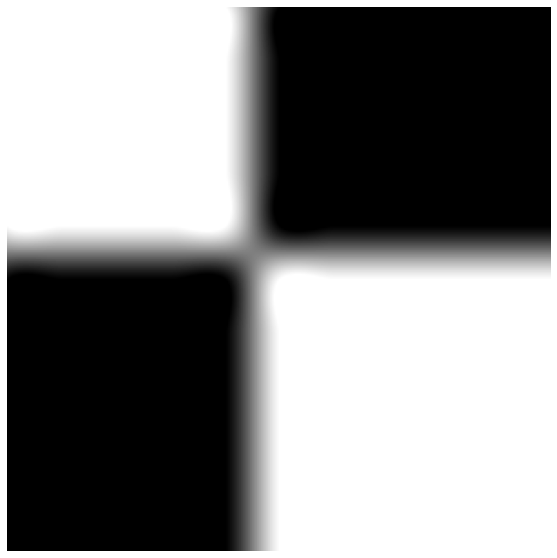

In [8]:
plot_img(interpolate_bicubic(chess, 30.0, 30.0))

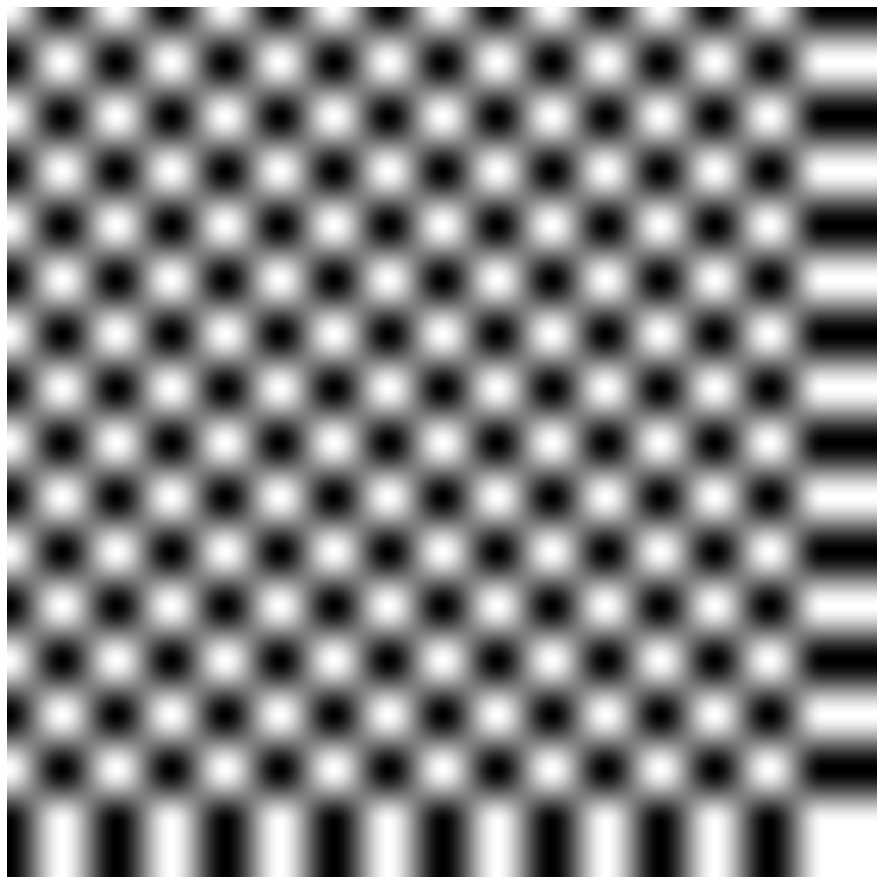

In [9]:
plot_img(interpolate_bicubic(chessboard, 30.0, 30.0))

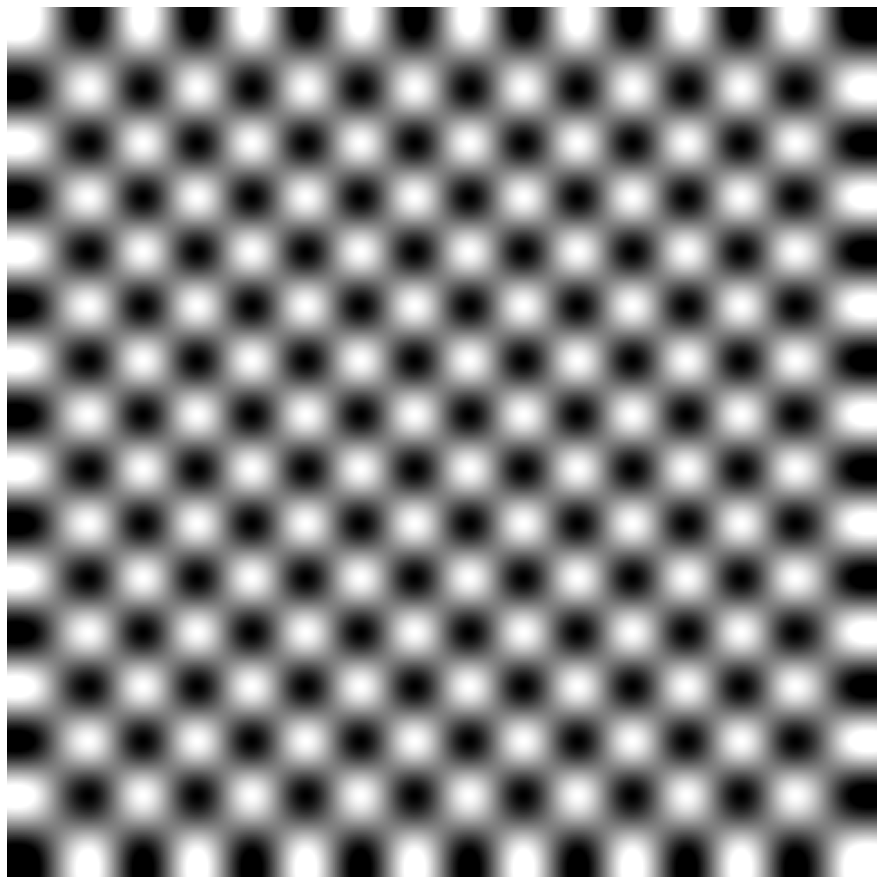

In [10]:
plot_img(cv2.resize(chessboard, (chessboard.shape[0] * 30, chessboard.shape[0] * 30), 
                    interpolation=cv2.INTER_CUBIC))

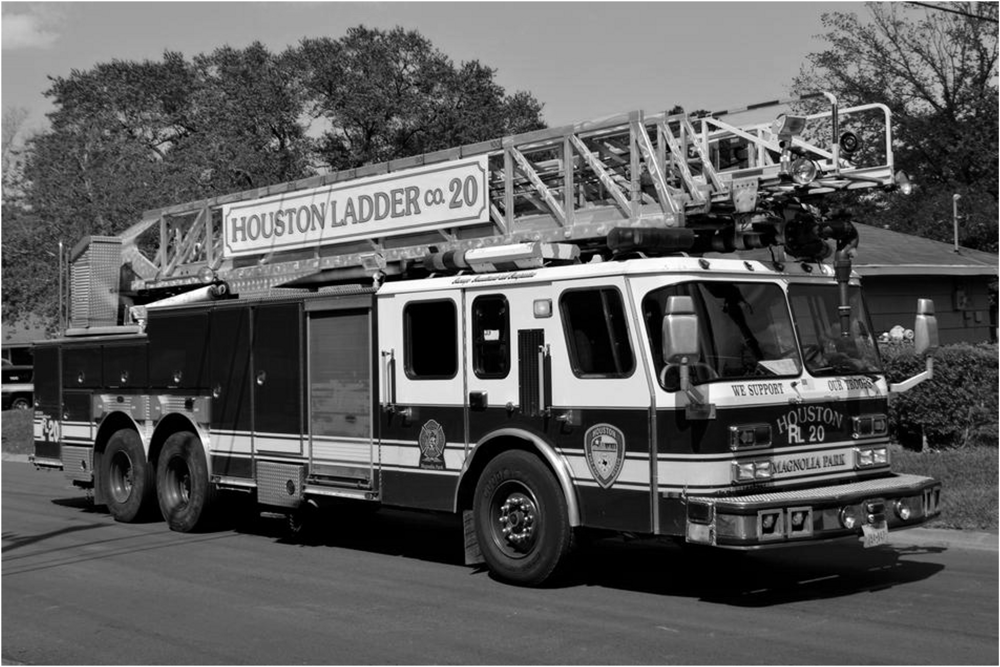

In [11]:
plot_img(interpolate_bicubic(firetruck, 4.5, 4.5))

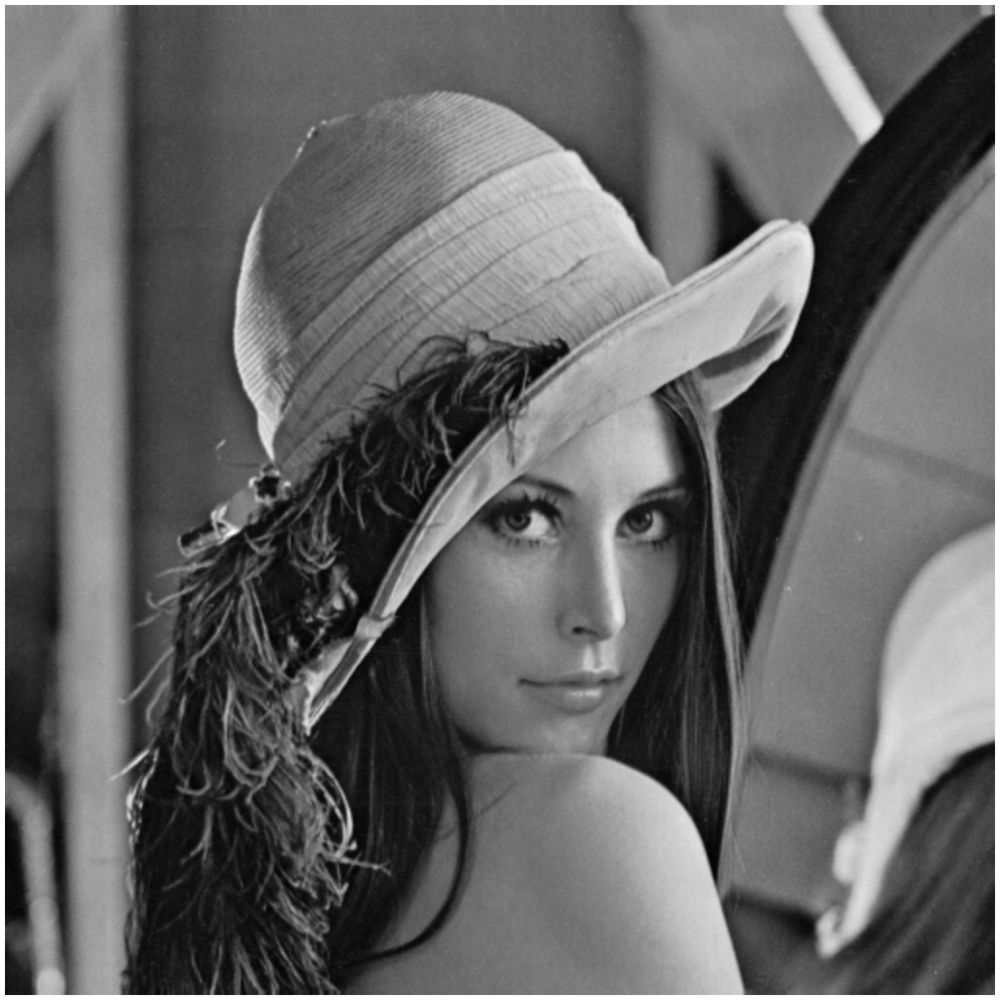

In [12]:
plot_img(interpolate_bicubic(lena, 1.5, 1.5))

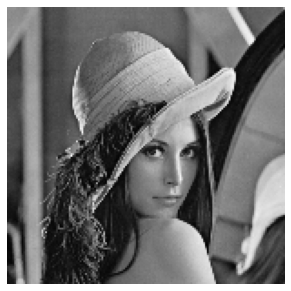

In [13]:
plot_img(interpolate_bicubic(lena, 0.3, 0.3))